# Tutorial 3: K-Means and Time Domain Reduction

A good tool to reduce computation time of GenX is to use <a href="https://genxproject.github.io/GenX/dev/methods/#Time-Domain-Reduction-(TDR)" target="_blank">Time Domain Reduction (TDR)</a>. Time Domain Reduction is a method that selects a smaller set of time steps from the data in a way that reduces computation time while still capturing the main information of the model. In this tutorial, we go over how TDR works in GenX and how it uses K-means clustering to choose the optimal time steps. For more information on TDR in capacity expansion models, see <a href="https://www.sciencedirect.com/science/article/pii/S0360544218315238" target="_blank">this paper</a>.

### Table of Contents
* [Time Domain Reduction](#TDR)
* [K-Means Clustering](#Kmeans)
* [Results of Time Domain Reduction](#TDRResults)
    * [Reconstruction](#Reconstruction)
* [Extreme Periods](#ExtPeriods)
* [Objective Values and Representative Periods](#ObjVals)

### Time Domain Reduction <a id="TDR"></a>

To see how Time Domain Reduction works, let's look at the `Load_data` in `Example_Systems_Tutorials/SmallNewEngland/OneZone`:

In [42]:
# First, load all packages needed
import Pkg; Pkg.add("ScikitLearn")
using DataFrames
using CSV
using VegaLite
using YAML
using PlotlyJS
using Plots
using Clustering
using ScikitLearn
@sk_import datasets: (make_blobs)

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`
Precompiling project...
  ✓ Distributions → DistributionsChainRulesCoreExt
  ✓ Plotly
  ✓ KernelDensity
  ✓ StatsPlots
  4 dependencies successfully precompiled in 8 seconds. 296 already precompiled. 1 skipped during auto due to previous errors.


PyObject <function make_blobs at 0x2b655d6c0>

In [235]:
case = joinpath("Example_Systems_Tutorials/SmallNewEngland/OneZone");

In [234]:
loads =  CSV.read(joinpath(case,"Load_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Load_MW_z1
,String7,String3,String3,String3,String3,String7,String7,Int64,Int64
1,50000,1,1,1,1,8760,8760,1,11162
2,,,,,,,,2,10556
3,,,,,,,,3,10105
4,,,,,,,,4,9878
5,,,,,,,,5,9843
6,,,,,,,,6,10017
7,,,,,,,,7,10390
8,,,,,,,,8,10727
9,,,,,,,,9,11298


The columns to note in this file are `Rep_Periods`, `TimeSteps_Per_Rep_Period`, `Time_Index`, and `Load_MW_z1`. This file shows the number of time steps used in GenX before applying TDR, i.e. every hour in a year, totaling 8,760 hours. This means that there is only one representative period, as seen in `Rep_Periods`.

TDR performs a "reduction" into a specified number of "representative periods", paring down the input data into a smaller set. The representative periods are then used in the GenX algorithm in place of the entire input data to reduce computation time. The TDR algorithm selects the representative periods to be the set of data whose results in GenX best match the results of the entire input data. To do this, TDR using k-means clustering, described in the next section.

When TDR is used, the file `time_domain_reduction_settings.yml` is called with a variety of specified settings, shown below:

In [236]:
time_domain_reduction_settings = YAML.load(open(joinpath(case,"Settings/time_domain_reduction_settings.yml")))

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => Dict{Any, Any}("Wind"=>Dict{Any, Any}("System"=>Di…
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "LoadWeight"            => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

Important here to note are `MinPeriods` and `MaxPeriods`. As TDR is performed, it is required to keep the number of representative periods to be between the min and max specified in the settings. This is to ensure that computation time is actually decreased and that the k-means algorithm doesn't just form one large cluster of all points. Additionally, `TimestepsPerRepPeriod` is set to 168, the number of hours in a week (`WeightTotal` includes all 8,760 timesteps, the number of hours in a year.) By specifying the number of timesteps in each representative period to be a week, we form 52 clusters from which the algorithm will choose 8-11.

For descriptions of all settings, see <a href="https://genxproject.github.io/GenX/dev/methods/#GenX.cluster_inputs" target="_blank">GenX.cluster_inputs</a> in the documentation.

Now back to pre-TDR. Below shows the load per timestep in megawatts for the entire dataset, i.e. with only one representative period of 8760 hours:

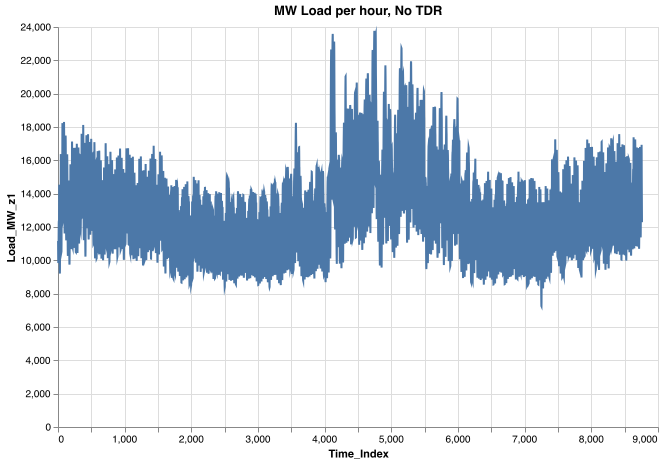

In [4]:
loads |>
@vlplot(:line, 
    x=:Time_Index, y=:Load_MW_z1, title="MW Load per hour, No TDR",
    width=600,height=400,linewidth=.01)

As in Tutorial 1, we can open the `genx_settings.yml` file for `SmallNewEngland/OneZone` to see how `TimeDomainReduction` is set. If it's set to 1, this means TDR is being used.

In [237]:
genx_settings_SNE = YAML.load(open((joinpath(case,"Settings/genx_settings.yml"))))

Dict{Any, Any} with 21 entries:
  "NetworkExpansion"                        => 0
  "TimeDomainReductionFolder"               => "TDR_Results"
  "ModelingToGenerateAlternativeIterations" => 3
  "ParameterScale"                          => 1
  "EnergyShareRequirement"                  => 1
  "PrintModel"                              => 0
  "TimeDomainReduction"                     => 1
  "Trans_Loss_Segments"                     => 1
  "CapacityReserveMargin"                   => 1
  "ModelingtoGenerateAlternativeSlack"      => 0.1
  "Solver"                                  => "HiGHS"
  "MethodofMorris"                          => 0
  "Reserves"                                => 0
  "StorageLosses"                           => 1
  "OverwriteResults"                        => 0
  "UCommit"                                 => 2
  "ModelingToGenerateAlternatives"          => 0
  "MaxCapReq"                               => 1
  "MinCapReq"                               => 1
  "CO2Cap"       

To visualize how TDR decreases computation time, let's start by running `SmallNewEngland/OneZone` without TDR. In the third section of this tutorial, we'll run the example again using TDR.

To run GenX without TDR, we start by editing the settings to set `TimeDomainReduction` to 0:

In [6]:
genx_settings_SNE["TimeDomainReduction"] = 0
genx_settings_SNE ## Output settings

Dict{Any, Any} with 21 entries:
  "NetworkExpansion"                        => 0
  "TimeDomainReductionFolder"               => "TDR_Results"
  "ModelingToGenerateAlternativeIterations" => 3
  "ParameterScale"                          => 1
  "EnergyShareRequirement"                  => 1
  "PrintModel"                              => 0
  "TimeDomainReduction"                     => 0
  "Trans_Loss_Segments"                     => 1
  "CapacityReserveMargin"                   => 1
  "ModelingtoGenerateAlternativeSlack"      => 0.1
  "Solver"                                  => "HiGHS"
  "MethodofMorris"                          => 0
  "Reserves"                                => 0
  "StorageLosses"                           => 1
  "OverwriteResults"                        => 0
  "UCommit"                                 => 2
  "ModelingToGenerateAlternatives"          => 0
  "MaxCapReq"                               => 1
  "MinCapReq"                               => 1
  "CO2Cap"       

Then we write the edited settings to the file path:

In [7]:
YAML.write_file((joinpath(case,"Settings/genx_settings.yml")), genx_settings_SNE)

And run it using `include`. (Note: this process will take a few minutes):

In [8]:
@time include("Example_Systems_Tutorials/SmallNewEngland/OneZone/Run.jl")

Configuring Settings
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv Successfully Read!
Maximum_capacity_requirement.csv Successfully Read!
Energy_share_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone
Generating the Optimization Model
Discharge Module
Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Emissions Module (for CO2 Policy modularization
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Modul

This took a little while to run, and would take even longer for larger systems. Let's see how we can get the run time down using Time Domain Reduction. The next sections go over how K-means clustering is used to perform TDR, and how to interpret the resulting files in GenX.

### K-means clustering <a id="Kmeans"></a>

Let's go over how TDR works. To perform TDR, GenX uses __K-means clustering__. K-means is an optimization method that clusters data into several groups based on their proximity to "centers" determined by the algorithm. 

K-means finds a set number of groups such that the variance between the distance of each point in the group to the mean of the group is minimized. 

$$
\begin{align*}
\mathop{\arg \min}\limits_{\mathbf{S}} & \sum_{i = 1}^k \sum_{x \in S_i} ||x - \mu_i||^2 \\
\end{align*}
$$

Where $\mathbf{S} = \{S_1, ... , S_k\}$ are the clusters, with $x$ denoting the elements of the clusters, and $\mu_i$ the mean of each cluster, i.e. the mean of the distances from each point to the center of the cluster. By taking the argmin over $\mathbf{S}$, the points $x$ are clustered into groups where their distance to the center is the smallest. For more information on how k-means works, see the  <a href="https://en.wikipedia.org/wiki/K-means_clustering" target="_blank">Wikipedia</a>. 

GenX uses the package `Clustering.jl`, with documentation <a href="https://juliastats.org/Clustering.jl/dev/kmeans.html#K-means" target="_blank">here</a>. As an example, using the package `ScikitLearn.jl`, let's generate data that can cluster easily.

In [9]:
centers = 5
X, y = make_blobs(n_samples=50,centers=centers); # From scikit-learn
b = DataFrame(X,:auto)

Row,x1,x2
,Float64,Float64
1,8.37068,2.47135
2,2.79883,0.93864
3,4.53513,-8.43453
4,1.87713,6.05135
5,8.86166,8.77077
6,5.98057,-8.42042
7,9.07236,1.62952
8,8.50355,0.926555
9,1.61077,2.90074


Note that clustering works for data without obvious groupings, but using blobs as an example makes k-means easier to visualize.

In [10]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,title="Before K-means Clustering")

Now we use the function `kmeans`, which is also used in `src/time_domain_reduction` in GenX.

In [13]:
R = kmeans(transpose(Matrix(b)),centers)

KmeansResult{Matrix{Float64}, Float64, Int64}([1.5477191517359288 8.874532902479205 … 8.34740554196646 6.370791232665235; 3.956791884134462 1.520010944875267 … 3.6750953965775652 -8.242413270296518], [2, 1, 5, 1, 3, 5, 2, 2, 1, 5  …  1, 1, 2, 1, 3, 1, 4, 3, 5, 3], [1.1589166749605795, 10.674520600155233, 3.406564927426558, 4.495671346566198, 0.4052305212017018, 0.18396113308222084, 0.05112822383449611, 0.4898190933589035, 1.1192135168851571, 3.6427063918318936  …  0.8578000783625512, 8.671404459871752, 0.6302636362306941, 1.3926597739990711, 1.5648326687390295, 6.166955539359428, 2.792643450036678, 4.164028488294605, 6.002592319687892, 0.343943668586121], [20, 6, 10, 4, 10], [20, 6, 10, 4, 10], 131.57451686222933, 4, true)

`kmeans` returns three outputs: assignments, centers, and counts. Assignments shows to which cluster each points belongs, centers shows where the center coordinates of each cluster are, and counts shows how many points belong to each cluster.

In [14]:
println("Assignments = ",R.assignments)
println("")
println("Counts = ",R.counts)
println("")
println("Centers:")
R.centers

Assignments = [2, 1, 5, 1, 3, 5, 2, 2, 1, 5, 5, 3, 3, 3, 1, 1, 3, 3, 4, 1, 1, 2, 5, 1, 5, 1, 3, 1, 2, 1, 1, 5, 4, 5, 1, 4, 1, 1, 1, 5, 1, 1, 2, 1, 3, 1, 4, 3, 5, 3]

Counts = [20, 6, 10, 4, 10]

Centers:


2×5 Matrix{Float64}:
 1.54772  8.87453  8.48555  8.34741   6.37079
 3.95679  1.52001  9.28436  3.6751   -8.24241

In [15]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,marker_z=R.assignments,c=:lightrainbow,title="After K-means Clustering")

In GenX, the representative periods are the centers of the clusters, each representing one week of the year. In the above example that would mean there are 52 data points gathered into 11 clusters (to see this for yourself, change `make_blobs` to have 52 data points and 11 clusters.)

### Results of Time Domain Reduction <a id="TDRResults"></a>

To visualize the results of TDR, we'll set TDR = 1 back in the `genx_settings.yml` file in `Example_Systems_Tutorials/SmallNewEngland/OneZone/`:

In [16]:
genx_settings_SNE["TimeDomainReduction"] = 1;

In [17]:
genx_settings_SNE

Dict{Any, Any} with 21 entries:
  "NetworkExpansion"                        => 0
  "TimeDomainReductionFolder"               => "TDR_Results"
  "ModelingToGenerateAlternativeIterations" => 3
  "ParameterScale"                          => 1
  "EnergyShareRequirement"                  => 1
  "PrintModel"                              => 0
  "TimeDomainReduction"                     => 1
  "Trans_Loss_Segments"                     => 1
  "CapacityReserveMargin"                   => 1
  "ModelingtoGenerateAlternativeSlack"      => 0.1
  "Solver"                                  => "HiGHS"
  "MethodofMorris"                          => 0
  "Reserves"                                => 0
  "StorageLosses"                           => 1
  "OverwriteResults"                        => 0
  "UCommit"                                 => 2
  "ModelingToGenerateAlternatives"          => 0
  "MaxCapReq"                               => 1
  "MinCapReq"                               => 1
  "CO2Cap"       

In [18]:
YAML.write_file((joinpath(case,"Settings/genx_settings.yml")), genx_settings_SNE)

And run GenX again with TDR:

In [19]:
@time include("Example_Systems_Tutorials/SmallNewEngland/OneZone/Run.jl")

Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv Successfully Read!
Maximum_capacity_requirement.csv Successfully Read!
Energy_share_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv 

Csv files with the results of TDR are generated automatically in a folder called `TDR_results` found within the same folder containing the input csv files, in this case `Example_Systems_Tutorials/SmallNewEngland/OneZone`. The csv files in this folder show the files used in `Run.jl` that have been pared down from the initial input files.

As an example, consider the input file `Fuels_data.csv`:

In [240]:
Fuels_original = CSV.read(joinpath(case,"Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,NG,None
,Int64,Float64,Int64
1,0,0.05306,0
2,1,5.28,0
3,2,5.28,0
4,3,5.28,0
5,4,5.28,0
6,5,5.28,0
7,6,5.28,0
8,7,5.28,0
9,8,5.28,0


Compared to `TDR_Results/Fuels_data.csv`:

In [243]:
Fuels_TDR = CSV.read(joinpath(case,"TDR_Results/Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,NG,None
,Int64,Float64,Float64
1,0,0.05306,0.0
2,1,5.28,0.0
3,2,5.28,0.0
4,3,5.28,0.0
5,4,5.28,0.0
6,5,5.28,0.0
7,6,5.28,0.0
8,7,5.28,0.0
9,8,5.28,0.0


As you can see, the original has all 8,760 hours, while the TDR version only has 1,848 hours.

In [244]:
loads_TDR = CSV.read(joinpath(case,"TDR_Results/Load_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Load_MW_z1
,String7,String3,String3,String3,String3,String3,String31,Int64,Float64
1,50000,1,1,1,11,168,673.8461538461539,1,11162.0
2,,,,,,,2021.5384615384617,2,10556.0
3,,,,,,,673.8461538461539,3,10105.0
4,,,,,,,1347.6923076923078,4,9878.0
5,,,,,,,1853.076923076923,5,9843.0
6,,,,,,,168.46153846153848,6,10017.0
7,,,,,,,1010.7692307692308,7,10390.0
8,,,,,,,336.92307692307696,8,10727.0
9,,,,,,,336.92307692307696,9,11298.0


The 1,848 hours are divided into 11 sections of 168 hours, with each section representing one week of the original data.  The number of hours per representative period is set in `time_domain_reduction_settings.yml`. Also specified in the file are the minimum and maximum number of clusters we would like to have (in this case 8 and 11). The k-means algorithm will then select the number of clusters that should be sufficient to capture the GenX model in fewer time steps (in this case 11).

In [245]:


Gen_TDR = CSV.read(joinpath(case,"TDR_Results/Generators_variability.csv"),DataFrame,missingstring="NA")



Row,Time_Index,natural_gas_combined_cycle,solar_pv,onshore_wind,battery
,Int64,Float64,Float64,Float64,Float64
1,1,1.0,0.0,0.889717,1.0
2,2,1.0,0.0,0.877715,1.0
3,3,1.0,0.0,0.903424,1.0
4,4,1.0,0.0,0.895153,1.0
5,5,1.0,0.0,0.757258,1.0
6,6,1.0,0.0,0.630929,1.0
7,7,1.0,0.0,0.557178,1.0
8,8,1.0,0.0,0.607249,1.0
9,9,1.0,0.1779,0.423418,1.0


In [246]:
generators = CSV.read(joinpath(case,"Generators_variability.csv"),DataFrame,missingstring="NA")

Row,Time_Index,natural_gas_combined_cycle,solar_pv,onshore_wind,battery
,Int64,Int64,Float64,Float64,Int64
1,1,1,0.0,0.889717,1
2,2,1,0.0,0.877715,1
3,3,1,0.0,0.903424,1
4,4,1,0.0,0.895153,1
5,5,1,0.0,0.757258,1
6,6,1,0.0,0.630929,1
7,7,1,0.0,0.557178,1
8,8,1,0.0,0.607249,1
9,9,1,0.1779,0.423418,1


Below, we create arrays out of the representative weeks and plot them on the same plot used in the beginning of this tutorial. The file `Period_map` shows which periods (weeks) are used in TDR and which time step corresponds to each period:

In [247]:

Period_map = CSV.read(joinpath(case,"TDR_Results/Period_map.csv"),DataFrame,missingstring="NA")

Row,Period_Index,Rep_Period,Rep_Period_Index
,Int64,Int64,Int64
1,1,1,1
2,2,1,1
3,3,1,1
4,4,1,1
5,5,8,2
6,6,8,2
7,7,8,2
8,8,8,2
9,9,8,2


In [226]:
# Find array of unique representative periods
rep_periods = unique(Period_map[!,"Rep_Period"])
# Create an array of the time steps and MW values of each representative period
weeks_load = []
weeks_wind = []
for i in rep_periods
    week_temp_loads = [repeat([i],168) loads[(168*i-167):168*i,8] loads[(168*i-167):168*i,9]]
    week_temp_wind = [repeat([i],168) generators[(168*i-167):168*i,1] generators[(168*i-167):168*i,4]]
    weeks_load = [weeks_load; week_temp_loads]
    weeks_wind = [weeks_wind; week_temp_wind]
end

In [227]:
# Combine with Total (pre TDR)
loads_plot = [repeat(["Total"],8760) loads[!,end-1] loads[!,end]];
wind_plot = [repeat(["Total"],8760) generators[!,1] generators[!,4]]

8760×3 Matrix{Any}:
 "Total"     1  0.889717
 "Total"     2  0.877715
 "Total"     3  0.903424
 "Total"     4  0.895153
 "Total"     5  0.757258
 "Total"     6  0.630929
 "Total"     7  0.557178
 "Total"     8  0.607249
 "Total"     9  0.423418
 "Total"    10  0.00747077
 "Total"    11  0.00253594
 "Total"    12  0.00215371
 "Total"    13  0.00445132
 ⋮              
 "Total"  8749  0.908309
 "Total"  8750  0.791801
 "Total"  8751  0.567352
 "Total"  8752  0.626725
 "Total"  8753  0.670432
 "Total"  8754  0.744819
 "Total"  8755  0.717831
 "Total"  8756  0.58014
 "Total"  8757  0.539212
 "Total"  8758  0.599321
 "Total"  8759  0.748014
 "Total"  8760  0.814334

In [27]:
# Add column names and convert column type
loads_with_TDR = [loads_plot; weeks_load]
loads_with_TDR = DataFrame(loads_with_TDR ,["Week","hour", "MW"])
loads_with_TDR[!,:hour] = convert.(Int64,loads_with_TDR[!,:hour]);
loads_with_TDR[!,:MW] = convert.(Float64,loads_with_TDR[!,:MW]);

In [228]:
wind_with_TDR = [wind_plot; weeks_wind]
wind_with_TDR = DataFrame(wind_with_TDR ,["Week","hour", "MW"])
wind_with_TDR[!,:hour] = convert.(Int64,wind_with_TDR[!,:hour]);
wind_with_TDR[!,:MW] = convert.(Float64,wind_with_TDR[!,:MW]);
wind_with_TDR

Row,Week,hour,MW
,Any,Int64,Float64
1,Total,1,0.889717
2,Total,2,0.877715
3,Total,3,0.903424
4,Total,4,0.895153
5,Total,5,0.757258
6,Total,6,0.630929
7,Total,7,0.557178
8,Total,8,0.607249
9,Total,9,0.423418


Here's the same plot from before but with representative weeks highlighted:

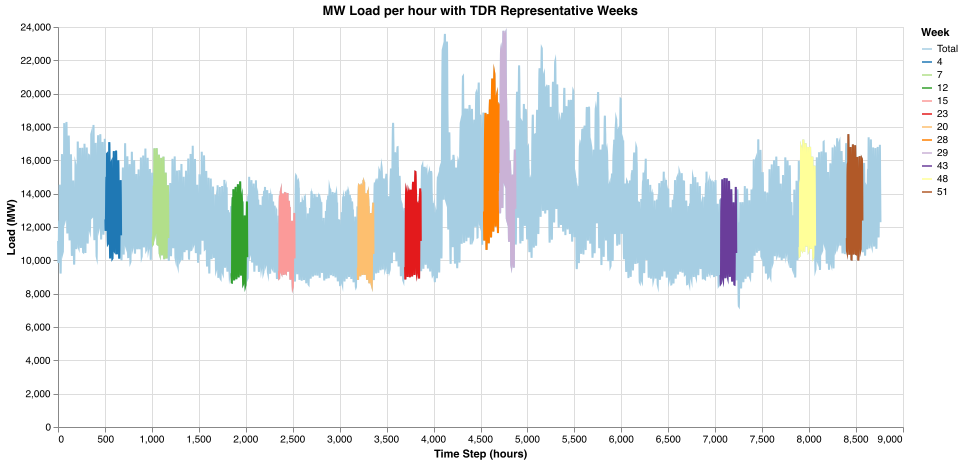

In [28]:
loads_with_TDR  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"}, title="MW Load per hour with TDR Representative Weeks",
    width=845,height=400)

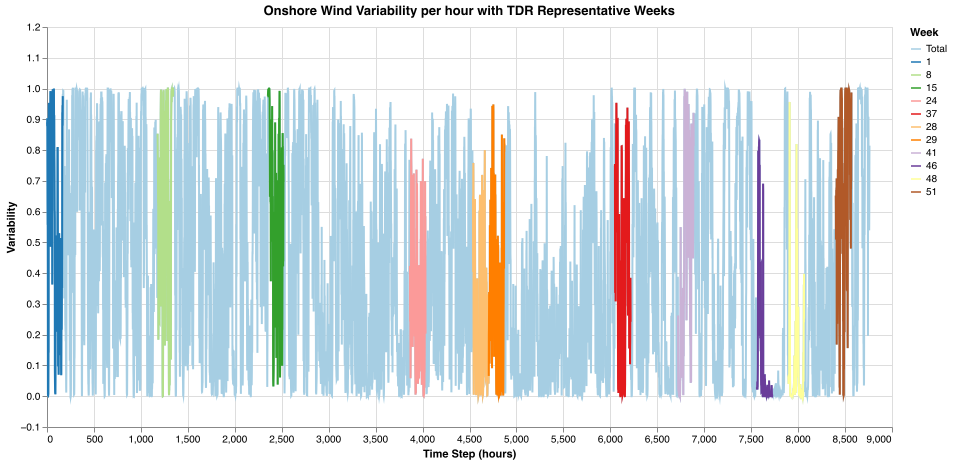

In [229]:
# F: what units?
wind_with_TDR  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Variability",scale={domain=[-.1,1.2]}}, 
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="Onshore Wind Variability per hour with TDR Representative Weeks",
    width=845,height=400)

In [75]:
# TO DO: Plot other loads?
# May be better to show wind instead of load -- generators variability
# Plot representative periods -- reconstructed time series

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168]


#### Reconstruction <a id="Reconstruction"></a>

Below is a plot of a reconstruction of the data using only the weeks isolated as representative periods. 

In [192]:
recon = []
for i in range(1,52)
    index = Period_map[i,"Rep_Period"]
    recon_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,9]]
    recon = [recon; recon_temp]
end

In [193]:
recon = DataFrame(recon,["Week","hour", "MW"])
recon[!,:hour] = convert.(Int64,recon[!,:hour]);
recon[!,:MW] = convert.(Float64,recon[!,:MW]);

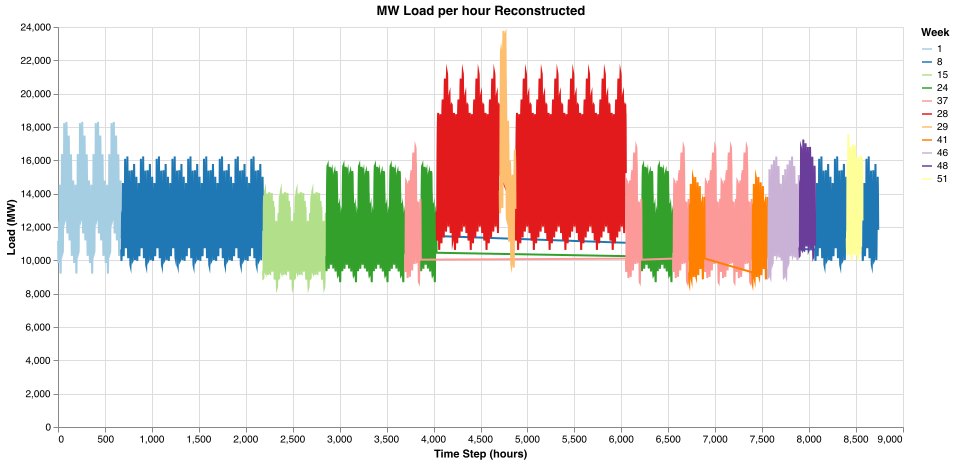

In [89]:
recon  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="MW Load per hour Reconstructed",
    width=845,height=400)

The range of 8-11 representative periods was chosen by the developers because it was deemed to be the smallest set that still matches the optimal value of the data well. The [last section](#ObjVals) of this Tutorial goes over how the optimal values of the data change as the number of representative periods changes.

### Extreme Periods Off <a id="ExtPeriods"></a>

GenX has a feature called `ExtremePeriods`, which forces kmeans to include the highest and lowest points in the algorithm. This is done to ensure outliers are used, which is needed in planning energy capacity as the system needs to be able to account for outliers in energy needs. In the above graph, we can see that energy needs peak during the summer, and that the week with the highest load demand is included as a representative week. Let's try turning extreme periods off, and see what happens. move this up

In [44]:
time_domain_reduction_settings["ExtremePeriods"] = 0;
YAML.write_file(joinpath(case,"Settings/genx_settings.yml"), genx_settings_SNE);
rm("Example_Systems_Tutorials/SmallNewEngland/OneZone/TDR_results", recursive=true) 

In [45]:
include("Example_Systems_Tutorials/SmallNewEngland/OneZone/Run.jl")

Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv Successfully Read!
Maximum_capacity_requirement.csv Successfully Read!
Energy_share_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv 

In [248]:
Loads_TDR2 = CSV.read(joinpath(case,"TDR_Results/Load_data.csv"),DataFrame,missingstring="NA");
Period_map2 = CSV.read(joinpath(case,"TDR_Results/Period_map.csv"),DataFrame,missingstring="NA");

In [180]:
rep_periods2 = unique(Period_map2[!,"Rep_Period"])

weeks2 = []
for i in rep_periods2
    week_temp = [repeat([i],168) loads[(168*i-167):168*i,8] loads[(168*i-167):168*i,9]]
    weeks2 = [weeks2; week_temp]
end

weeks2 = [weeks2 repeat(["Off"],1848)];

In [178]:
loads_plotOff = [repeat(["Total"],8760) loads[!,end-1] loads[!,end] repeat(["Off"],8760) ];
loads_with_TDR[!,"Extreme_Periods"] = repeat(["On"],length(loads_with_TDR[!,1]));
loads_with_TDR2 = [loads_plotOff; weeks2]

In [181]:
loads_with_TDR2 = DataFrame(loads_with_TDR2 ,["Week","hour","MW","Extreme_Periods"])
loads_with_TDR2[!,:hour] = convert.(Int64,loads_with_TDR2[!,:hour]);
loads_with_TDR2[!,:MW] = convert.(Float64,loads_with_TDR2[!,:MW]);

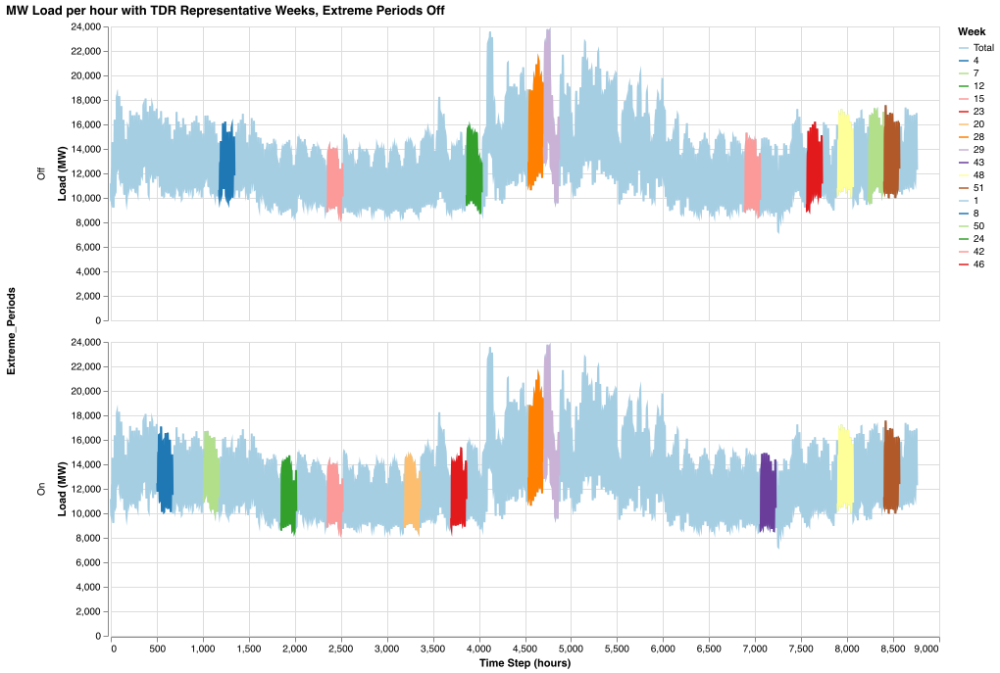

In [183]:
[loads_with_TDR; loads_with_TDR2] |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"}, 
    title="MW Load per hour with TDR Representative Weeks, Extreme Periods Off",
    width=845,height=300)

In [195]:
recon[!,"Extreme_Periods"] = repeat(["On"],length(recon[!,1]));

In [201]:
length(recon_noex)

26208

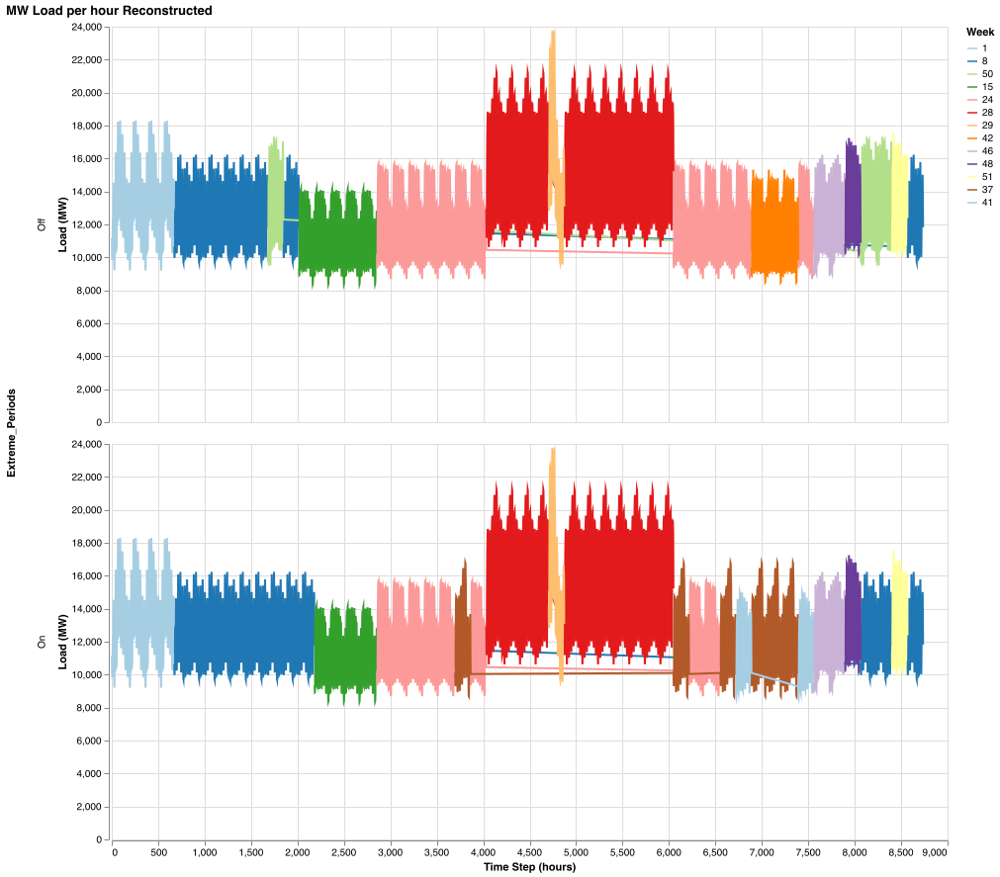

In [205]:
recon_noex = []
for i in range(1,52)
    index = Period_map2[i,"Rep_Period"]
    recon_noex_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,9]]
    recon_noex = [recon_noex; recon_noex_temp]
end

recon_noex = [recon_noex repeat(["Off"],8736)];

recon_noex = DataFrame(recon_noex,["Week","hour", "MW", "Extreme_Periods"])
recon_noex[!,:hour] = convert.(Int64,recon_noex[!,:hour]);
recon_noex[!,:MW] = convert.(Float64,recon_noex[!,:MW]);

[recon_noex; recon]  |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="MW Load per hour Reconstructed",
    width=845,height=400)

### Objective Values and Representative Periods <a id="ObjVals"></a>

Each time `Run.jl` is run, a `Results` folder is produced. This folder contains numerous .csv files with output variable from the GenX model. For more information on all outputs, see the documentation <a href="https://genxproject.github.io/GenX/dev/data_documentation/#Outputs" target="_blank">here</a>.

This section focuses on the __objective value__ of the model. In optimization problems, the objective value is the main value minimized or maximized within the constraints of the model, according to the __objective function__ specified in the problem formulation. In the case of GenX, the objective function is the total annual electricity system cost. A detailed description of the optimization problem is  <a href="https://genxproject.github.io/GenX/dev/objective_function/" target="_blank">here</a> in the documentation. 

For the purpose of this tutorial, we focus on the objective value as a way to evaluate how well the representative periods actually "represent" the entire model. To see how well the objective value of representative periods aligns with that of the total period, we can run `SmallNewEngland/OneZone` with a variety of minimum and maximum total periods.

Each time `Run.jl` is run, a new results folder appears in the model folder. These folders are not overwritten. So far, we've run the model twice, so we should have two results folders, `Results` and `Results_1` in the `OneZone` folder, but you may have more if you've run the model more than twice. To ensure that the following code works, we'll delete any Results folders beyond the original.

In [29]:
folders = cd(readdir,case)

18-element Vector{String}:
 ".DS_Store"
 "CO2_cap.csv"
 "Capacity_reserve_margin.csv"
 "Energy_share_requirement.csv"
 "Fuels_data.csv"
 "Generators_data.csv"
 "Generators_variability.csv"
 "Load_data.csv"
 "Maximum_capacity_requirement.csv"
 "Minimum_capacity_requirement.csv"
 "Network.csv"
 "README.md"
 "Reserves.csv"
 "Results"
 "Results_1"
 "Run.jl"
 "Settings"
 "TDR_Results"

In [30]:
for folder in folders
    if length(folder) >= 8 && folder[1:8] == "Results_"
        rm("Example_Systems_Tutorials/SmallNewEngland/OneZone/" * folder,recursive=true) 
    end
end

In [31]:
cd(readdir,case) ## Make sure they were deleted

17-element Vector{String}:
 ".DS_Store"
 "CO2_cap.csv"
 "Capacity_reserve_margin.csv"
 "Energy_share_requirement.csv"
 "Fuels_data.csv"
 "Generators_data.csv"
 "Generators_variability.csv"
 "Load_data.csv"
 "Maximum_capacity_requirement.csv"
 "Minimum_capacity_requirement.csv"
 "Network.csv"
 "README.md"
 "Reserves.csv"
 "Results"
 "Run.jl"
 "Settings"
 "TDR_Results"

Now, we're going to change the min and max periods in the TDR settings. As a reminder, here are the time domain reduction settings we've been using:

In [32]:
time_domain_reduction_settings

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => Dict{Any, Any}("Wind"=>Dict{Any, Any}("System"=>Di…
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "LoadWeight"            => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

To demonstrate how the objective value changes as the number of representative periods does, we'll run GenX ten times, each with a different number of periods, and plot the objective values.

In [33]:
# Change MinPeriods and Max Periods, run `Run.jl`
# For simplicity, keep min and max periods the same
rep_periods = [4, 8, 12, 24, 36, 48]

for i in range(1,6)
    println(" ")
    println("----------------------------------------------------")
    println("Iteration ",i)
    println("Periods = ",rep_periods[i])
    println("----------------------------------------------------")
    time_domain_reduction_settings["MinPeriods"] = rep_periods[i]
    time_domain_reduction_settings["MaxPeriods"] = rep_periods[i]
    if "TDR_Results" in cd(readdir,case)
        rm(joinpath(case,"TDR_results", recursive=true) 
    end
    println(" ")
    YAML.write_file(joinpath(case,"Settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)
    @time include("Example_Systems_Tutorials/SmallNewEngland/OneZone/Run.jl");
end

    

 
----------------------------------------------------
Iteration 1
Periods = 4
----------------------------------------------------
 
Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv Successfully Read!
Maximum_capacity_requirement.csv Successfully Read!
Energy_share_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_var

Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Load_data.csv Successfully Read!
Fuels_data.csv Successfully Read!
Generators_data.csv Successfully Read!
Generators_variability.csv Successfully Read!
Validating time basis
Capacity_reserve_margin.csv Successfully Read!
Minimum_capacity_requirement.csv Successfully Read!
Maximum_capacity_requirement.csv Successfully Read!
Energy_share_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone
Generating the Optimization Model
Discharge Module
Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Emissions Module (for CO2 Policy modularization
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commi

Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
C02 Policies Module
Energy Share Requirement Policies Module
Capacity Reserve Margin Policies Module
Minimum Capacity Requirement Module
Maximum Capacity Requirement Module
Time elapsed for model building is
0.386591208
Solving Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
117655 rows, 57172 cols, 445825 nonzeros
114102 rows, 53623 cols, 440450 nonzeros
Presolve : Reductions: rows 114102(-18970); columns 53623(-6869); elements 440450(-102740)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0    -4.3563148067e+00 Ph1: 207(959.665); Du: 25(4.35631) 0s
      13963     3.9536208823e+03 Pr: 11758(42064.1); Du: 0(0.000985174) 5s
      18701     3.9536378462e+03 Pr: 12505(29604

Time elapsed for writing time weights is
0.001831834
Time elapsed for writing reserve margin is
0.008811583
Time elapsed for writing capacity value is
3.94713275
Time elapsed for writing net revenue is
0.029376792
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/Example_Systems_Tutorials/SmallNewEngland/OneZone/Results_6
Time elapsed for writing is
8.685378125
120.918458 seconds (32.36 M allocations: 1.701 GiB, 0.27% gc time, 6.47% compilation time)


Note that as the number of periods increases, so does the time it takes to run.

Now, let's check that we have the correct Results folders and process the objecive values to plot. There should be seven results folders, including the original `Results`.

In [249]:
cd(readdir,case)

24-element Vector{String}:
 ".DS_Store"
 "CO2_cap.csv"
 "Capacity_reserve_margin.csv"
 "Energy_share_requirement.csv"
 "Fuels_data.csv"
 "Generators_data.csv"
 "Generators_variability.csv"
 "Load_data.csv"
 "Maximum_capacity_requirement.csv"
 "Minimum_capacity_requirement.csv"
 "Network.csv"
 "README.md"
 "Reserves.csv"
 "Results"
 "Results_1"
 "Results_2"
 "Results_3"
 "Results_4"
 "Results_5"
 "Results_6"
 "Results_7"
 "Run.jl"
 "Settings"
 "TDR_Results"

The objective value is found in the files `costs.csv` and `status.csv`.

In [231]:
status = CSV.read(joinpath(case,"Results/status.csv"),DataFrame,missingstring="NA")

Row,Status,Solve,Objval
,String7,Float64,Float64
1,OPTIMAL,155.045,10592.9


In [35]:
# Find objective values from each results folder:

OV_noTDR = CSV.read(joinpath(case,"Results/status.csv"),DataFrame);
OV_RP4 = CSV.read(joinpath(case,"Results_1/status.csv"),DataFrame);
OV_RP8 = CSV.read(joinpath(case,"Results_2/status.csv"),DataFrame);
OV_RP12 = CSV.read(joinpath(case,"Results_3/status.csv"),DataFrame);
OV_RP24 = CSV.read(joinpath(case,"Results_4/status.csv"),DataFrame);
OV_RP36 = CSV.read(joinpath(case,"Results_5/status.csv"),DataFrame);
OV_RP48 = CSV.read(joinpath(case,"Results_6/status.csv"),DataFrame);

In [36]:
# Isolate the objective values from the data frame
obj_val_tot = [1 OV_noTDR[!,3]; 
               4 OV_RP4[!,3];
               8 OV_RP8[!,3];
               12 OV_RP12[!,3]; 
               24 OV_RP24[!,3]; 
               36 OV_RP36[!,3]; 
               48 OV_RP48[!,3]]

7×2 Matrix{Float64}:
  1.0  10592.9
  4.0   8460.45
  8.0   9188.39
 12.0  10303.7
 24.0  10277.0
 36.0  10989.9
 48.0  10388.9

In [37]:
# Take the absolute difference between the original objective value and the new ones
obj_val_plot = [4 abs(OV_noTDR[!,3][1]-OV_RP4[!,3][1]); 
                8 abs(OV_noTDR[!,3][1]-OV_RP8[!,3][1]); 
                12 abs(OV_noTDR[!,3][1]-OV_RP12[!,3][1]);
                24 abs(OV_noTDR[!,3][1]-OV_RP24[!,3][1]); 
                36 abs(OV_noTDR[!,3][1]-OV_RP36[!,3][1]); 
                48 abs(OV_noTDR[!,3][1]-OV_RP48[!,3][1])]

6×2 Matrix{Float64}:
  4.0  2132.5
  8.0  1404.55
 12.0   289.271
 24.0   315.95
 36.0   396.964
 48.0   204.018

In [ ]:
# Add axis and dots for run time

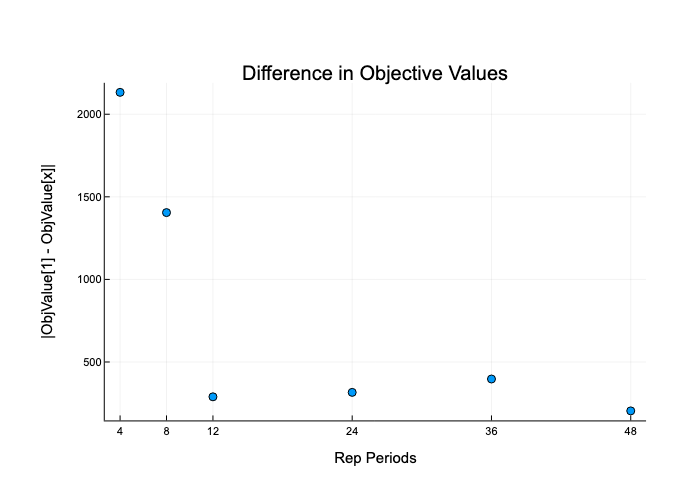

In [57]:
# Plot the differences as a function of number of representative periods
plotlyjs()
Plots.scatter(obj_val_plot[:,1],obj_val_plot[:,2],hover=obj_val_plot[:,2],legend=false,xticks=obj_val_plot[:,1],
                ylabel="|ObjValue[1] - ObjValue[x]|",xlabel="Rep Periods",title="Difference in Objective Values")

Here, we can see that while having very few representative periods produces an objective value that differs greatly from the orignal, once we reach around 12 representative periods the difference begins to taper out. Therefore, the original choice of 11 maximum periods in `SmallNewEngland/OneZone` decreases the run time of GenX significantly while while maintaining an objective value close to the original.


It's important to note, however, that  the difference does not always taper out, and for some systems you'll find that the error in objective value continues to decrease as the number of representative periods increases. There also is no way to know apriori what number of periods works.

Finally, let's set TDR to have 8 and 11 min/max periods again, and delete the TDR Results folder.

In [39]:
time_domain_reduction_settings["MinPeriods"] = 8;
time_domain_reduction_settings["MaxPeriods"] = 11;

In [ ]:
time_domain_reduction_settings

In [40]:
rm(joinpath(case,"TDR_results", recursive=true) 

In [41]:
YAML.write_file(joinpath(case,"Settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)